<a href="https://colab.research.google.com/github/derivai7/PCVK_Ganjil_2023/blob/main/Week7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**PRAKTIKUM**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
import math
from  google.colab.patches import cv2_imshow
from PIL import Image as im

In [ ]:
def convolution2d(image, kernel, stride, padding):
    # Menambahkan tepi (padding) pada citra
    padded_image = np.pad(image, padding, mode='constant', constant_values=0)

    # Menghitung dimensi citra yang telah ditambahkan tepi dan hasil konvolusi
    kernel_height, kernel_width = kernel.shape
    padded_height, padded_width = padded_image.shape
    output_height = (padded_height - kernel_height) // stride + 1
    output_width = (padded_width - kernel_width) // stride + 1

    # Membuat matriks untuk hasil konvolusi
    convolved_image = np.zeros((output_height, output_width), dtype=np.float32)

    # Proses konvolusi
    for y in range(0, output_height):
        for x in range(0, output_width):
            # Mengambil jendela sesuai dengan ukuran kernel
            image_window = padded_image[y * stride:y * stride + kernel_height, x * stride:x * stride +
                                        kernel_width]

            # Melakukan konvolusi dengan kernel dan menyimpan hasilnya
            convolved_image[y][x] = np.sum(image_window * kernel).astype(np.float32)

    return convolved_image

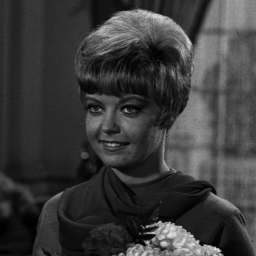

In [ ]:
# Membaca gambar dan mengonversinya ke citra grayscale
input_image = cv.imread('/content/drive/MyDrive/dataset/female.tiff')
grayscale_image = cv.cvtColor(input_image, cv.COLOR_BGR2GRAY)

cv2_imshow(grayscale_image)

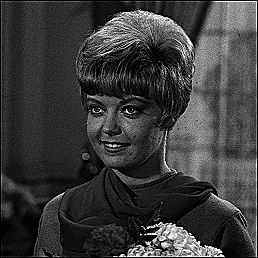

In [ ]:
# Operasi Sharpen
sharpening_kernel = np.array([[0, -1, 0],
                                                   [-1, 5, -1],
                                                   [0, -1, 0]])

# Konfigurasi parameter konvolusi
stride = 1  # Nilai stride (langkah)
padding = 2  # Nilai padding (penambahan tepi)

# Memanggil fungsi konvolusi
convolved_image = convolution2d(grayscale_image, sharpening_kernel, stride, padding)

# Tampilkan hasil konvolusi
cv2_imshow(convolved_image)

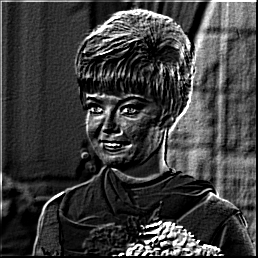

In [ ]:
# Operasi Emboss
emboss_kernel = np.array([[-2, -1, 0],
                                             [-1, 1, 1],
                                             [0, 1, 2]])

convolved_emboss = convolution2d(grayscale_image, emboss_kernel, stride, padding)
cv2_imshow(convolved_emboss)

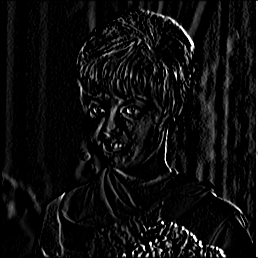

In [ ]:
# Operasi Left Sobel Edge Detection
sobel_kernel_left = np.array([[1, 0, -1],
                                                [2, 0, -2],
                                                [1, 0, -1]])

left_sobel_edge = convolution2d(grayscale_image, sobel_kernel_left, stride, padding)
cv2_imshow(left_sobel_edge)

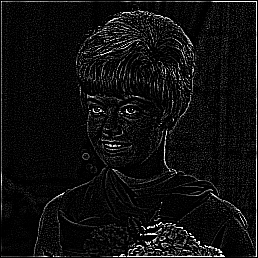

In [ ]:
# Operasi Canny Edge Detection
canny_edge_kernel = np.array([[-1, -1, -1],
                              [-1, 8, -1],
                              [-1, -1, -1]])

canny_edge_result = convolution2d(grayscale_image, canny_edge_kernel, stride, padding)
cv2_imshow(canny_edge_result)

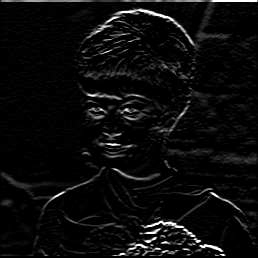

In [ ]:
# Operasi Prewitt Edge Detective
prewitt_kernel = np.array([[-1, -1, -1],
                                            [0, 0, 0],
                                            [1, 1, 1]])

convolved_prewitt = convolution2d(grayscale_image, prewitt_kernel, stride, padding)
cv2_imshow(convolved_prewitt)

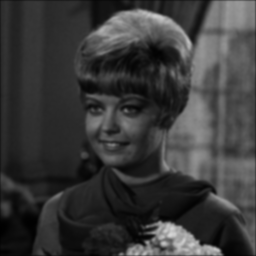

In [ ]:
# Operasi 5x5 Gaussian Blur
gaussian_blur_kernel = np.array([
    [1,  4,  6,  4,  1],
    [4, 16, 24, 16,  4],
    [6, 24, 36, 24,  6],
    [4, 16, 24, 16,  4],
    [1,  4,  6,  4,  1]
], dtype=np.float32) / 256.0

gaussian_blur_result = convolution2d(grayscale_image, gaussian_blur_kernel, stride, padding)
cv2_imshow(gaussian_blur_result)

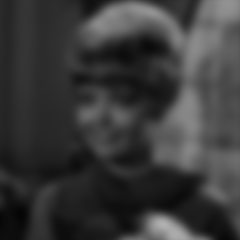

In [ ]:
# Operasi 21x21 Gaussian Blur

# Membuat kernel Gaussian 21x21
sigma = math.sqrt(21)
gaussian_kernel = cv.getGaussianKernel(21, sigma)
gaussian_kernel_2d = gaussian_kernel @ gaussian_kernel.transpose()

# Konfigurasi parameter konvolusi
stride = 1  # Nilai stride (langkah)
padding = 2  # Nilai padding (penambahan tepi)

# Memanggil fungsi konvolusi
gaussian_blur_result = convolution2d(grayscale_image, gaussian_kernel_2d, stride, padding)

# Menampilkan hasil operasi Gaussian Blur 21x21
cv2_imshow(gaussian_blur_result)

**TUGAS PRAKTIKUM**

In [ ]:
def adjust_brightness(image, brightness_factor):
    adjusted_image = np.zeros(image.shape, image.dtype)

    for y in range(image.shape[0]):
        for x in range(image.shape[1]):
            for c in range(image.shape[2]):
                adjusted_image[y, x, c] = np.clip(image[y, x, c] + brightness_factor, 0, 255)

    return adjusted_image

def histogram_equalization(image):
    channels = cv.split(image)
    equalized_channels = []
    for channel, color in zip(channels, ["red", "green", "blue"]):
        equalized_channels.append(cv.equalizeHist(channel))

    equalized_image = cv.merge(equalized_channels)
    return equalized_image

def adjust_contrast(image, contrast_factor):
    adjusted_image = cv.convertScaleAbs(image, alpha=contrast_factor, beta=0)
    return adjusted_image

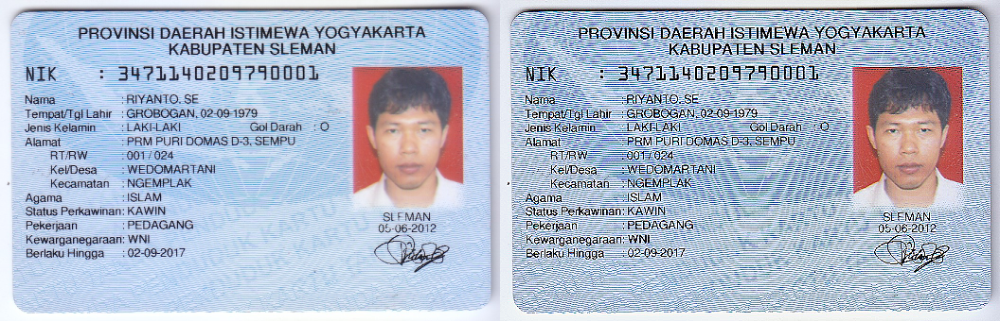

In [ ]:
# Membaca gambar KTP pertama
ktp_image = cv.imread('/content/drive/MyDrive/dataset/KTP More/ktp1.png')

# Mengubah ukuran gambar KTP menjadi setengah dari ukuran aslinya
ktp_image = cv.resize(ktp_image, (0, 0), fx=0.5, fy=0.5)

# Menyesuaikan kecerahan gambar KTP pertama
brightness_adjusted = adjust_brightness(ktp_image, -10)

# Menggunakan sharpening kernel untuk meningkatkan ketajaman gambar KTP pertama
sharpened_result = cv.filter2D(brightness_adjusted, -1, sharpening_kernel)

# Menggabungkan gambar KTP pertama asli, dan gambar yang sudah diolah
final_frame = cv.hconcat([ktp_image, sharpened_result])

# Menampilkan hasil pemrosesan gambar KTP pertama
cv2_imshow(final_frame)

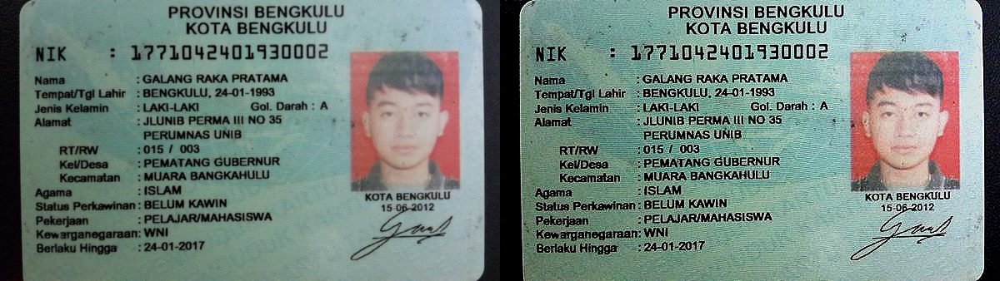

In [ ]:
# Membaca gambar KTP kedua
ktp_image2 = cv.imread('/content/drive/MyDrive/dataset/KTP More/ktp2.png')

# Menyesuaikan kontras gambar KTP kedua
contrast_adjusted2 = adjust_contrast(ktp_image2, 1.3)

# Menyesuaikan kecerahan gambar KTP kedua
brightness_adjusted2 = adjust_brightness(contrast_adjusted2, -30)

# Menggunakan sharpening kernel untuk meningkatkan ketajaman gambar KTP kedua
sharpened_result2 = cv.filter2D(brightness_adjusted2, -1, sharpening_kernel)

# Menggabungkan gambar KTP kedua asli dengan gambar KTP kedua yang sudah diolah
final_frame2 = cv.hconcat([ktp_image2, sharpened_result2])

# Menampilkan hasil pemrosesan gambar KTP kedua
cv2_imshow(final_frame2)

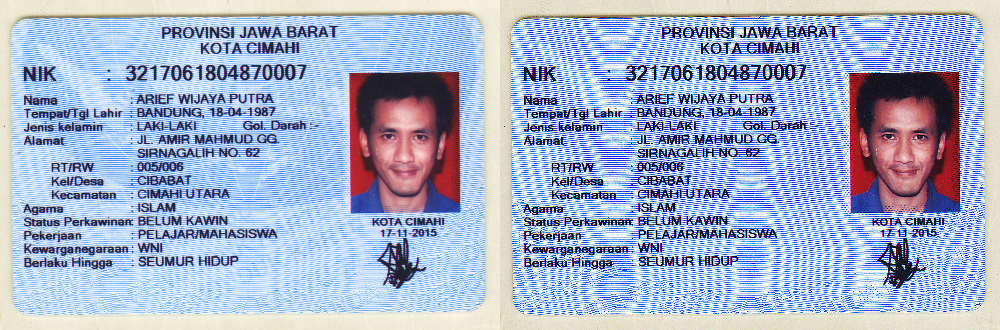

In [ ]:
# Membaca gambar KTP ketiga
ktp_image3 = cv.imread('/content/drive/MyDrive/dataset/KTP More/ktp3.png')

# Menyesuaikan kecerahan gambar KTP ketiga
brightness_adjusted3 = adjust_brightness(ktp_image3, -10)

# Menggunakan sharpening kernel untuk meningkatkan ketajaman gambar KTP ketiga
sharpened_result3 = cv.filter2D(brightness_adjusted3, -1, sharpening_kernel)

# Menggabungkan gambar KTP ketiga asli dengan gambar KTP ketiga yang sudah diolah
final_frame3 = cv.hconcat([ktp_image3, sharpened_result3])

# Menampilkan hasil pemrosesan gambar KTP ketiga
cv2_imshow(final_frame3)

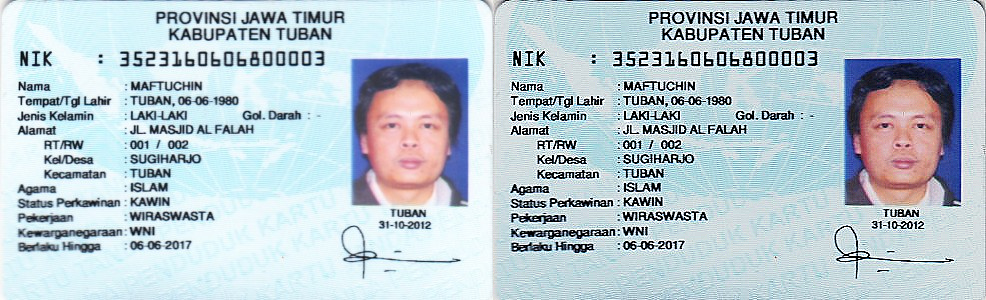

In [ ]:
# Membaca gambar KTP keempat
ktp_image4 = cv.imread('/content/drive/MyDrive/dataset/KTP More/ktp4.png')

# Menyesuaikan kecerahan gambar KTP keempat
brightness_adjusted4 = adjust_brightness(ktp_image4, -30)

# Menggunakan sharpening kernel untuk meningkatkan ketajaman gambar KTP keempat
sharpened_result4 = cv.filter2D(brightness_adjusted4, -1, sharpening_kernel)

# Menggabungkan gambar KTP keempat asli dengan gambar KTP keempat yang sudah diolah
final_frame4 = cv.hconcat([ktp_image4, sharpened_result4])

# Menampilkan hasil pemrosesan gambar KTP keempat
cv2_imshow(final_frame4)

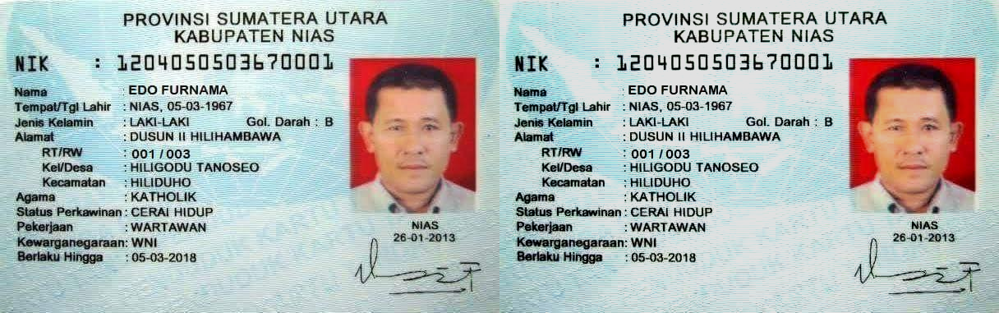

In [ ]:
# Membaca gambar KTP kelima
ktp_image5 = cv.imread('/content/drive/MyDrive/dataset/KTP More/ktp5.png')

# Menyesuaikan kontras gambar KTP kelima
contrast_adjusted5 = adjust_contrast(ktp_image5, 1.2)

# Menyesuaikan kecerahan gambar hasil penyesuaian kontras
brightness_adjusted5 = adjust_brightness(contrast_adjusted5, -30)

# Menggunakan sharpening kernel untuk meningkatkan ketajaman gambar KTP kelima
sharpened_result5 = cv.filter2D(brightness_adjusted5, -1, sharpening_kernel)

# Menggabungkan gambar KTP kelima asli dengan gambar hasil penyesuaian kecerahan
final_frame5 = cv.hconcat([ktp_image5, brightness_adjusted5])

# Menampilkan hasil pemrosesan gambar KTP kelima
cv2_imshow(final_frame5)

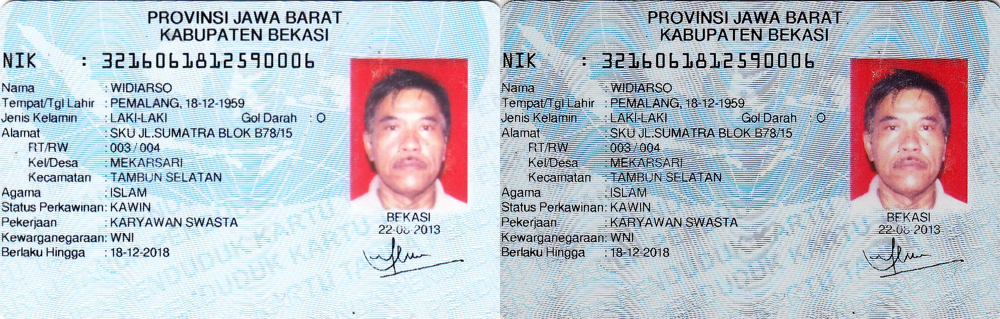

In [ ]:
# Membaca gambar KTP keenam
ktp_image6 = cv.imread('/content/drive/MyDrive/dataset/KTP More/ktp6.png')

# Menggunakan sharpening kernel untuk meningkatkan ketajaman gambar KTP keenam
sharpened_result6 = cv.filter2D(ktp_image6, -1, sharpening_kernel)

# Menyesuaikan kecerahan gambar hasil pengasahan
brightness_adjusted6 = adjust_brightness(sharpened_result6, -30)

# Menggabungkan gambar KTP keenam asli dengan gambar hasil penyesuaian kecerahan
final_frame6 = cv.hconcat([ktp_image6, brightness_adjusted6])

# Menampilkan hasil pemrosesan gambar KTP keenam
cv2_imshow(final_frame6)

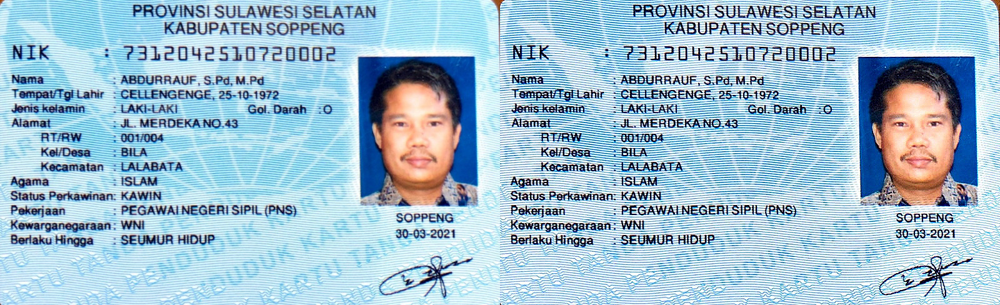

In [ ]:
# Membaca gambar KTP ketujuh
ktp_image7 = cv.imread('/content/drive/MyDrive/dataset/KTP More/ktp7.jpeg')

# Menggunakan sharpening kernel untuk meningkatkan ketajaman gambar KTP ketujuh
sharpened_result7 = cv.filter2D(ktp_image7, -1, sharpening_kernel)

# Menggabungkan gambar KTP ketujuh asli dengan gambar hasil pengasahan
final_frame7 = cv.hconcat([ktp_image7, sharpened_result7])

# Menampilkan hasil pemrosesan gambar KTP ketujuh
cv2_imshow(final_frame7)